In [ ]:
pip install opencv-python numpy

**Instalación de librerías (si es necesario):**

In [ ]:
pip install opencv-python numpy

Intentando procesar 5 imágenes...
Esquinas encontradas en chessboard/1000142981.jpg
Mostrando imagen con esquinas detectadas (presiona cualquier tecla para continuar):


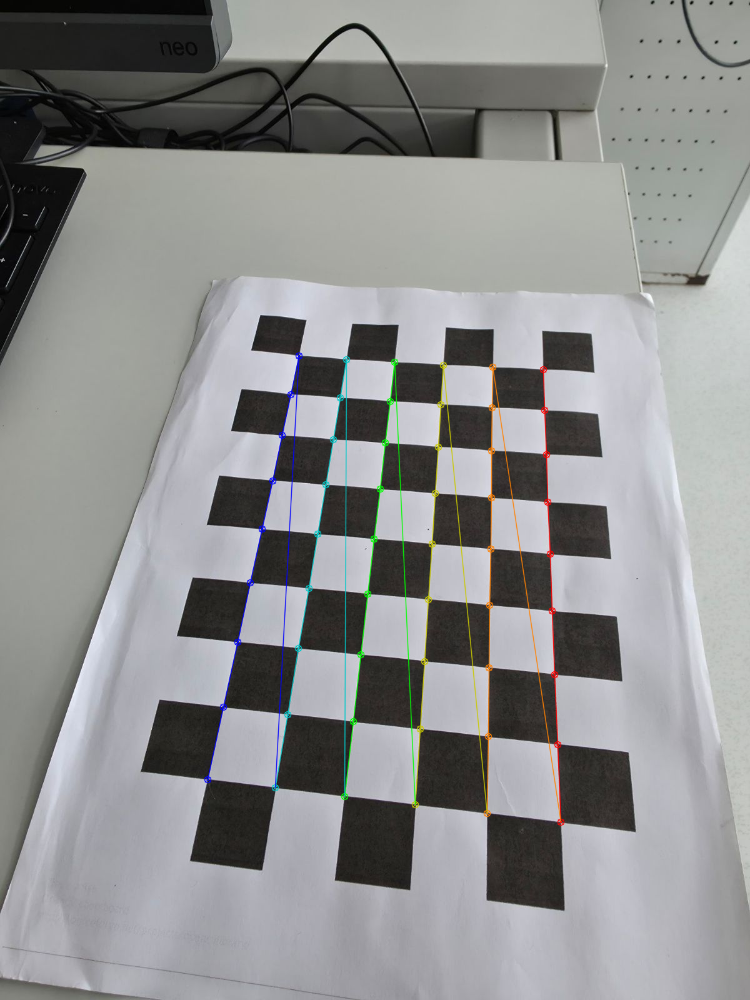

Esquinas encontradas en chessboard/1000142993.jpg
Mostrando imagen con esquinas detectadas (presiona cualquier tecla para continuar):


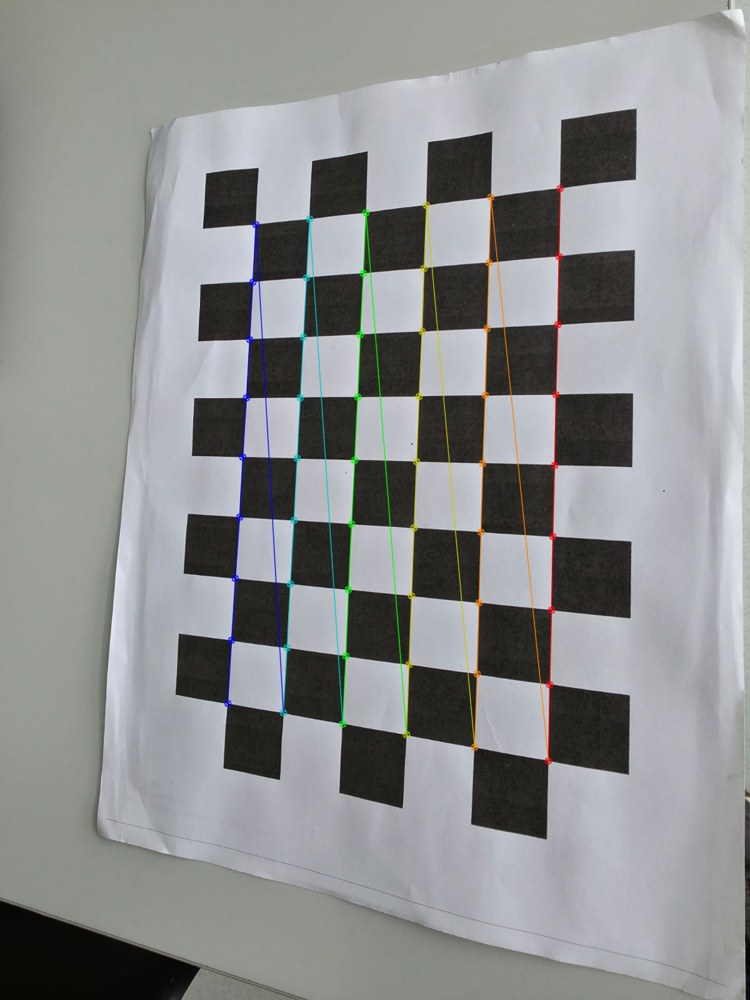

Esquinas encontradas en chessboard/1000142810.jpg
Mostrando imagen con esquinas detectadas (presiona cualquier tecla para continuar):


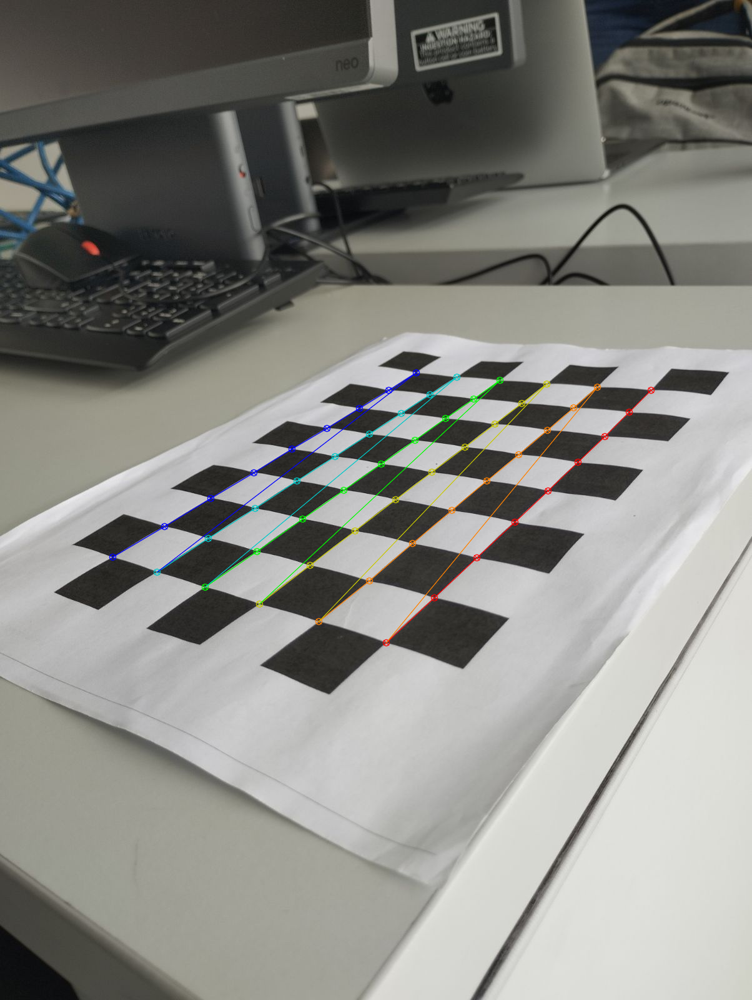

Esquinas encontradas en chessboard/1000142885.jpg
Mostrando imagen con esquinas detectadas (presiona cualquier tecla para continuar):


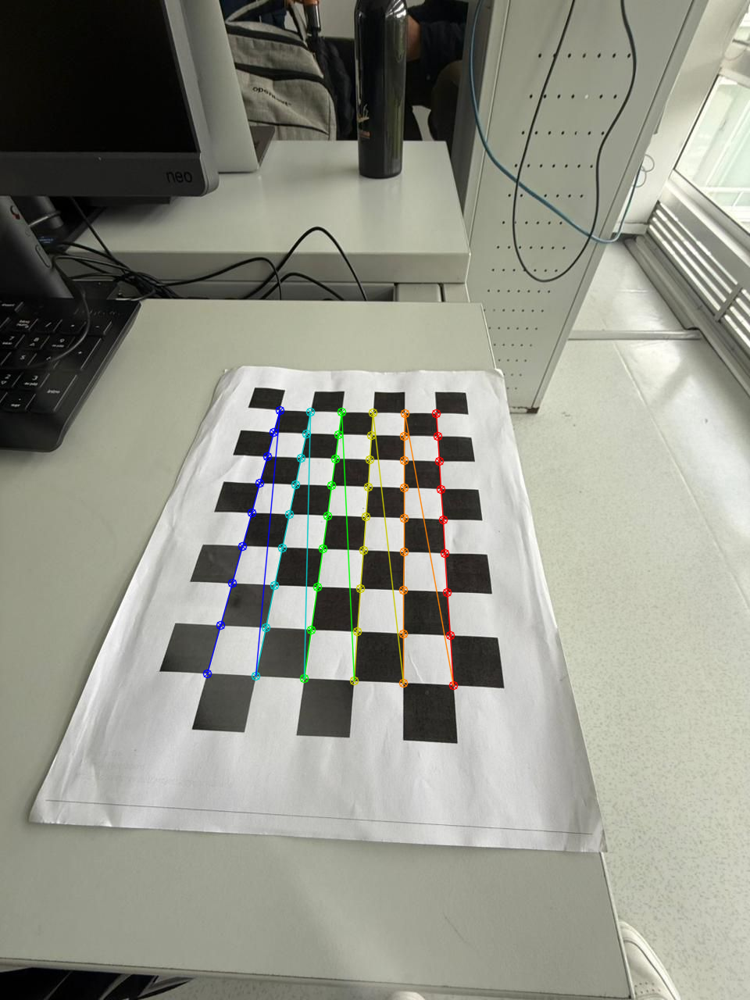

Esquinas encontradas en chessboard/1000142977.jpg
Mostrando imagen con esquinas detectadas (presiona cualquier tecla para continuar):


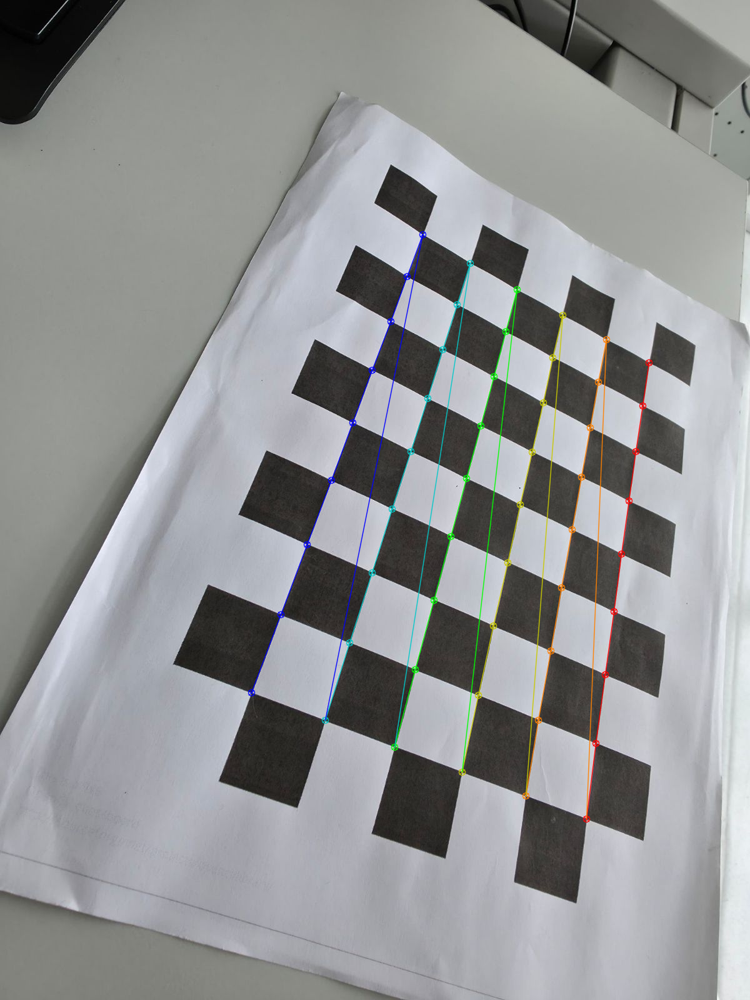


Encontradas esquinas en 5 imágenes. Procediendo con la calibración.

Matriz de la cámara:
 [[1.24219497e+03 0.00000000e+00 6.43521852e+02]
 [0.00000000e+00 1.22953370e+03 7.22483568e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]

Coeficientes de distorsión:
 [[ -0.61570437   4.90857404   0.02756779   0.02681436 -11.0899532 ]]

Imagen corregida (recortada) guardada como 'calibrated_result_9x6_cropped.jpg'

Mostrando la imagen corregida (recortada):


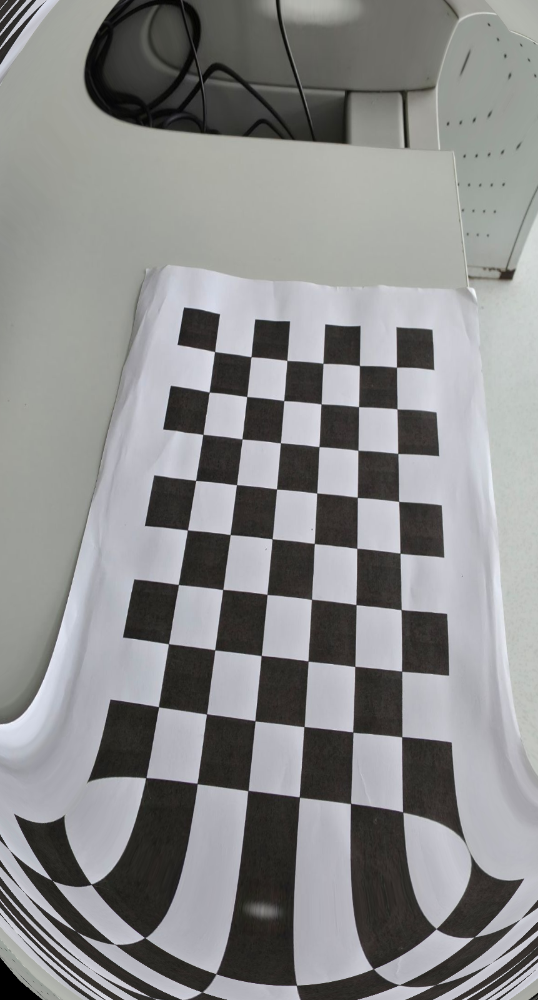

In [ ]:
import cv2
import numpy as np
import glob
from google.colab.patches import cv2_imshow # Importar cv2_imshow para mostrar imágenes en Colab

# Definir dimensiones del tablero (esquinas internas) para un tablero de 10x7 cuadros -> 9x6 esquinas internas
chessboard_size = (9, 6) # Cambiado a 9x6 para un tablero de 10x7 cuadros

# Criterio de terminación de subpixeles
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Preparar puntos 3D (0,0,0 ... 8,5,0 para un tablero de 9x6 esquinas)
objp = np.zeros((np.prod(chessboard_size), 3), np.float32)
objp[:, :2] = np.mgrid[0:chessboard_size[0], 0:chessboard_size[1]].T.reshape(-1, 2)

# Arrays para almacenar puntos de objeto y puntos de imagen de todas las imágenes.
objpoints = [] # Puntos 3D en el espacio del mundo real
imgpoints = [] # Puntos 2D en el plano de la imagen.

# Cargar imágenes del tablero
# Asegúrate de tener una carpeta llamada 'chessboard' con imágenes de tu tablero
images = glob.glob('chessboard/*.jpg')

# Verificar si se encontraron imágenes
if not images:
    print("No se encontraron imágenes en la carpeta 'chessboard'. Asegúrate de que la carpeta existe y contiene imágenes .jpg.")
else:
    print(f"Intentando procesar {len(images)} imágenes...")
    for fname in images:
        img = cv2.imread(fname)
        if img is None:
            print(f"Error al cargar la imagen: {fname}")
            continue

        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Encontrar las esquinas del tablero de ajedrez
        ret, corners = cv2.findChessboardCorners(gray, chessboard_size, None)

        # Si se encuentran las esquinas, añadir puntos de objeto e imagen
        if ret:
            print(f"Esquinas encontradas en {fname}")
            objpoints.append(objp)

            # Refinar las esquinas a subpixeles
            corners2 = cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)
            imgpoints.append(corners2)

            # Dibujar las esquinas en la imagen para verificar (opcional, descomentar para ver)
            cv2.drawChessboardCorners(img, chessboard_size, corners2, ret)
            print("Mostrando imagen con esquinas detectadas (presiona cualquier tecla para continuar):")
            cv2_imshow(img)
            # cv2.waitKey(0) # Esperar a que se presione una tecla para cerrar la imagen

        else:
            print(f"No se encontraron esquinas en {fname}")
            # Opcional: Mostrar la imagen donde no se encontraron esquinas
            # print(f"Mostrando imagen donde no se encontraron esquinas: {fname}")
            # cv2_imshow(img)
            # cv2.waitKey(0)


    # cv2.destroyAllWindows() # No es necesario con cv2_imshow

    # Calibración de la cámara solo si se encontraron suficientes puntos
    if len(objpoints) > 0:
        print(f"\nEncontradas esquinas en {len(objpoints)} imágenes. Procediendo con la calibración.")
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

        print("\nMatriz de la cámara:\n", mtx)
        print("\nCoeficientes de distorsión:\n", dist)

        # Corrección de una imagen de prueba (la primera imagen donde se encontraron esquinas)
        if images and len(imgpoints) > 0:
            # Encontrar la primera imagen para la que se encontraron esquinas para corregir
            # Nota: Esto asume que images[0] es una de las imágenes donde se encontraron esquinas.
            # Si quieres corregir la primera imagen de la lista 'images' sin importar si se encontraron esquinas,
            # puedes usar images[0] directamente, pero la corrección solo será válida si la calibración fue exitosa.
            # Aquí corregimos la primera imagen de la lista 'images' asumiendo que la calibración fue exitosa.
            img = cv2.imread(images[0])

            if img is not None:
                h, w = img.shape[:2]
                newcameramtx, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))

                # Corregir la distorsión
                dst = cv2.undistort(img, mtx, dist, None, newcameramtx)

                # Recortar la imagen usando el ROI (Region of Interest)
                x, y, w_roi, h_roi = roi
                dst_cropped = dst[y:y+h_roi, x:x+w_roi]

                # Guardar la imagen corregida (con recorte)
                cv2.imwrite('calibrated_result_9x6_cropped.jpg', dst_cropped)
                print("\nImagen corregida (recortada) guardada como 'calibrated_result_9x6_cropped.jpg'")

                # Mostrar la imagen corregida (con recorte)
                print("\nMostrando la imagen corregida (recortada):")
                cv2_imshow(dst_cropped)
            else:
                print("\nError al cargar la primera imagen para corrección.")


    else:
        print("\nNo se pudieron encontrar esquinas de tablero de ajedrez válidas en ninguna de las imágenes. No se pudo realizar la calibración.")